# Dota 2 Observers and Sentry Wards Data Exploration

## Observer Wards
- are purchasable, stackable consumables
- invisible watcher that gives **ground vision** (obstructed vision) in a 1600 radius to your team. Lasts 6 minutes.

https://dota2.fandom.com/wiki/Observer_Ward

## Sentry Wards
- are purchasable, stackable consumables
- invisible watcher that grants **True Sight** (detects invisibility), the ability to see invisible enemy units and wards, to any existing allied vision within a radius.
- Does not grant ground vision

https://dota2.fandom.com/wiki/Sentry_Ward

In [2]:
# Imports
from tqdm import tqdm
import glob
import os
import json
from pprint import pprint
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

from game_data_collector.api import Role, get_hero_ids_of_role

### Support stats overview

In [ ]:
# Building the data frame from the raw data
# TODO I'm skipping the database integration for now (query building etc.) to cut some time for faster EDA
supports_li = []
json_files = list(glob.iglob(os.path.join("..", "resources", "data", "*.json")))

# filter data
support_hero_ids = get_hero_ids_of_role(Role.SUPPORT)


# 20013/20013 [00:29<00:00, 686.45it/s]
for j in tqdm(json_files):
    with open(j, "r", encoding="utf-8") as fi:
        match = json.load(fi)
        [supports_li.append({"match_id": match["match_id"], "hero_id": player["hero_id"], "rank_tier": player["rank_tier"], "assists": player["assists"], "deaths": player["deaths"], "obs_placed": player["observers_placed"], "obs_killed": player["observer_kills"], "sen_placed": player["sen_placed"], "sen_killed": player["sentry_kills"]}) for player in match["players"] if player["hero_id"] in support_hero_ids]
                                
supports = pd.DataFrame(supports_li)


supports.dropna(inplace=True)
supports["rank_group"] = (supports["rank_tier"] // 10).astype(int).astype("category")

print(supports.head())

100%|██████████| 20013/20013 [00:29<00:00, 686.45it/s]


     match_id  hero_id  rank_tier  assists  deaths  obs_placed  obs_killed  \
0  7861499456       64       55.0       21       6           8           1   
2  7861499456      123       61.0        7       2           1           1   
3  7862231043       58       43.0       12      12           0           1   
4  7862231043       64       41.0       30       5          10           1   
5  7862233444      101       53.0       18       6           4           5   

   sen_placed  sen_killed rank_group  
0          11           1          5  
2           0           1          6  
3           0           1          4  
4          17           5          4  
5          12           4          5  


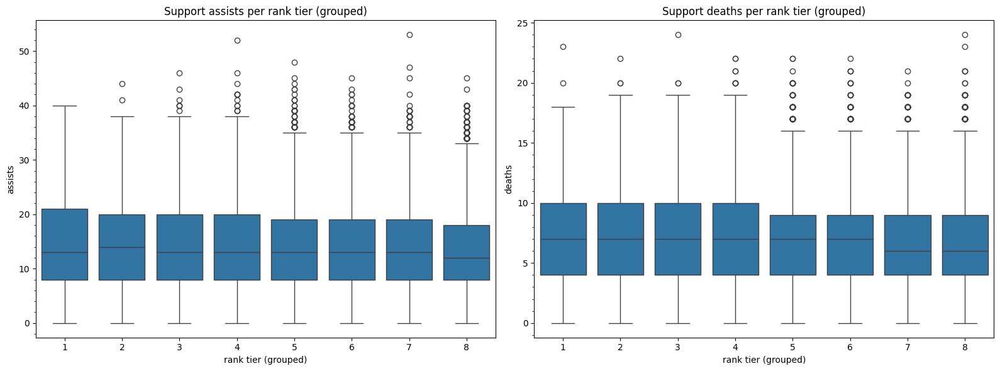

In [ ]:
# assists / deaths
fig = plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
sns.boxplot(supports, x = "rank_group", y = "assists")
plt.title("Support assists per rank tier")
plt.xlabel("rank tier (grouped)")

# minor ticks
plt.minorticks_on()
plt.tick_params(axis='y', which='minor', left=True)
plt.tick_params(axis='x', which='minor', bottom=False)

plt.subplot(1, 2, 2)
sns.boxplot(supports, x = "rank_group", y = "deaths")
plt.title("Support deaths per rank tier")
plt.xlabel("rank tier (grouped)")

# minor ticks
plt.minorticks_on()
plt.tick_params(axis='y', which='minor', left=True)
plt.tick_params(axis='x', which='minor', bottom=False)

plt.tight_layout()
plt.show()

### Warding

In [ ]:
# Look at overall placed / killed stats first
support_sen = pd.melt(supports, id_vars=["match_id", "rank_group"], var_name="sen", value_vars=["sen_placed", "sen_killed"])
support_obs = pd.melt(supports, id_vars=["match_id", "rank_group"], var_name="obs", value_vars=["obs_placed", "obs_killed"])
support_wards = support_sen.merge(support_obs, on = ["match_id"])
print(support_wards.head())

     match_id rank_group_x         sen  value_x rank_group_y         obs  \
0  7861499456            5  sen_placed       11            5  obs_placed   
1  7861499456            5  sen_placed       11            6  obs_placed   
2  7861499456            5  sen_placed       11            5  obs_killed   
3  7861499456            5  sen_placed       11            6  obs_killed   
4  7861499456            6  sen_placed        0            5  obs_placed   

   value_y  
0        8  
1        1  
2        1  
3        1  
4        8  


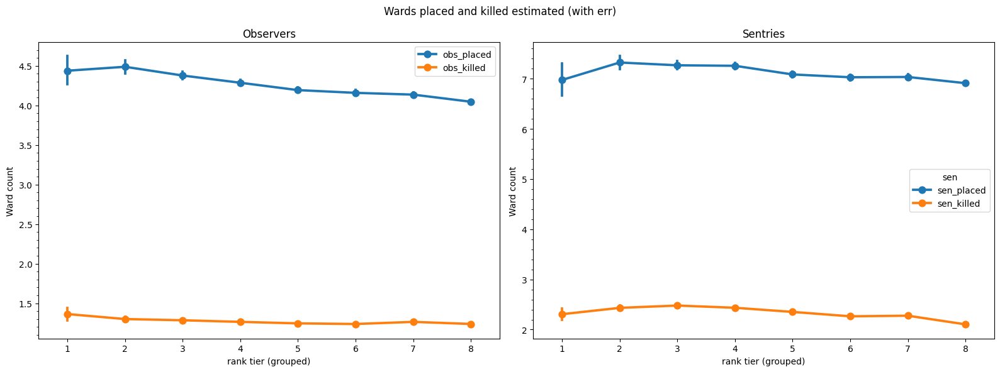

In [54]:
# assists / deaths
fig = plt.figure(figsize=(16, 6))
plt.suptitle("Wards placed and killed estimated (with err)")

plt.subplot(1, 2, 1)
sns.pointplot(support_wards, x = "rank_group_y", y = "value_y", hue= "obs")
plt.title("Observers")
plt.xlabel("rank tier (grouped)")

# minor ticks
plt.minorticks_on()
plt.tick_params(axis='y', which='minor', left=True)
plt.tick_params(axis='x', which='minor', bottom=False)
plt.ylabel("Ward count")
plt.legend()
plt.subplot(1, 2, 2)
sns.pointplot(support_wards, x = "rank_group_x", y = "value_x", hue= "sen")
plt.title("Sentries")
plt.xlabel("rank tier (grouped)")

# minor ticks
plt.minorticks_on()
plt.tick_params(axis='y', which='minor', left=True)
plt.tick_params(axis='x', which='minor', bottom=False)
plt.ylabel("Ward count")

plt.tight_layout()
plt.show()

In [5]:
# Example data structure

""" {
    "obs_log": [
        {
            "time": -42,
            "type": "obs_log",
            "slot": 0,
            "x": 179.3,
            "y": 100.8,
            "z": 129,
            "entityleft": false,
            "ehandle": 7307646,
            "key": "[179,101]",
            "player_slot": 0
        }
    ],
    "sen_log": [
        {
            "time": -28,
            "type": "sen_log",
            "slot": 0,
            "x": 162,
            "y": 99.9,
            "z": 129,
            "entityleft": false,
            "ehandle": 13795721,
            "key": "[162,100]",
            "player_slot": 0
        }
    ]
} """

' {\n    "obs_log": [\n        {\n            "time": -42,\n            "type": "obs_log",\n            "slot": 0,\n            "x": 179.3,\n            "y": 100.8,\n            "z": 129,\n            "entityleft": false,\n            "ehandle": 7307646,\n            "key": "[179,101]",\n            "player_slot": 0\n        }\n    ],\n    "sen_log": [\n        {\n            "time": -28,\n            "type": "sen_log",\n            "slot": 0,\n            "x": 162,\n            "y": 99.9,\n            "z": 129,\n            "entityleft": false,\n            "ehandle": 13795721,\n            "key": "[162,100]",\n            "player_slot": 0\n        }\n    ]\n} '

In [6]:
# Building the data frame from the raw data
# TODO I'm skipping the database integration for now (query building etc.) to cut some time for faster EDA
supports_li = []
json_files = list(glob.iglob(os.path.join("..", "resources", "data", "*.json")))

# 20006/20006 [01:46<00:00, 187.85it/s]
for j in tqdm(json_files):
    with open(j, "r", encoding="utf-8") as fi:
        match = json.load(fi)

        for player in match["players"]:
            for obs in player["obs_log"]:
                supports_li.append({"match_id": match["match_id"], "hero_id": player["hero_id"], "rank_tier": player["rank_tier"], "time": obs["time"], "type": obs["type"], "x": obs["x"], "y": obs["y"]})
            for obs in player["sen_log"]:
                supports_li.append({"match_id": match["match_id"], "hero_id": player["hero_id"], "rank_tier": player["rank_tier"], "time": obs["time"], "type": obs["type"], "x": obs["x"], "y": obs["y"]})
                                
coords = pd.DataFrame(supports_li)

100%|██████████| 20013/20013 [00:29<00:00, 673.93it/s]


In [7]:
coords.dropna(inplace=True)
coords["rank_group"] = (coords["rank_tier"] // 10).astype(int).astype("category")
coords["time"] = (coords["time"] / 60)
print(coords.head())


     match_id  hero_id  rank_tier       time     type      x      y rank_group
0  7861499456       64       55.0  -0.700000  obs_log  179.3  100.8          5
1  7861499456       64       55.0   7.166667  obs_log  188.2  115.9          5
2  7861499456       64       55.0  11.883333  obs_log   82.3  174.6          5
3  7861499456       64       55.0  14.366667  obs_log  115.6  182.3          5
4  7861499456       64       55.0  15.216667  obs_log  124.0  131.6          5


### Observer Wards

In [8]:
# filter data
support_hero_ids = get_hero_ids_of_role(Role.SUPPORT)

# only consider higher rank supports
coords_obs_support = coords[(coords["hero_id"].isin(support_hero_ids)) & (coords["rank_group"].isin([1, 2, 7])) & (coords["type"] == "obs_log")]

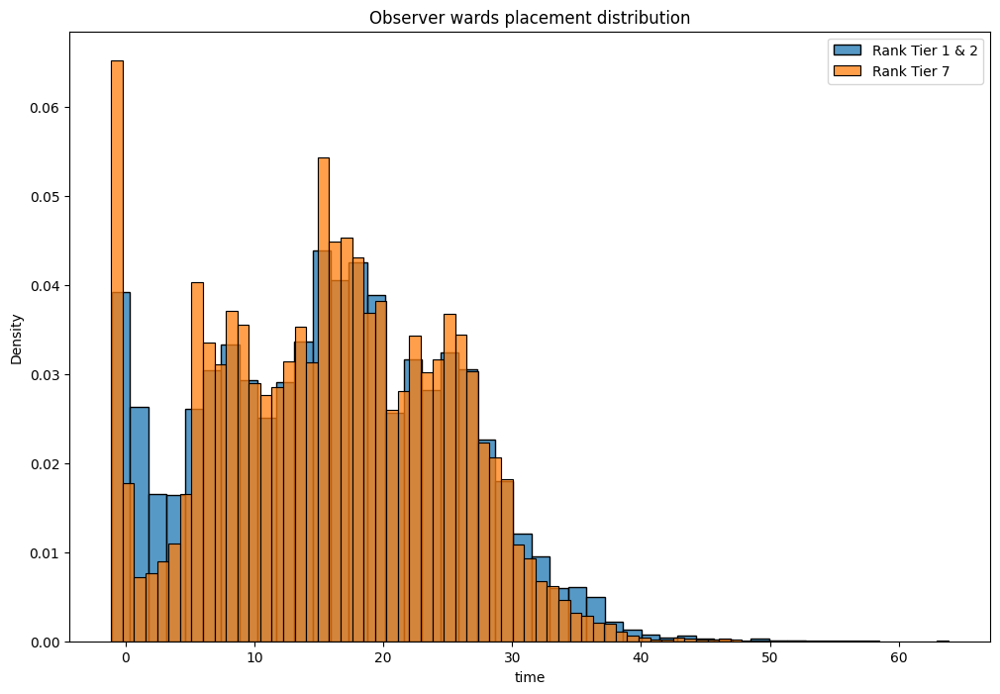

In [9]:
# hist for the ward placement assuming 'time' field equals match duration
fig = plt.figure(figsize=(12, 8))

sns.histplot(coords_obs_support[coords_obs_support["rank_group"].isin([1, 2])], x = "time", stat = "density", label = "Rank Tier 1 & 2")
sns.histplot(coords_obs_support[coords_obs_support["rank_group"].isin([7])], x = "time", stat = "density", label = "Rank Tier 7")
plt.legend(loc = "upper right")
plt.title("Observer wards placement distribution")
plt.show()

# -42s good player place before official start?
# TODO timed scatter map early peak vs later on

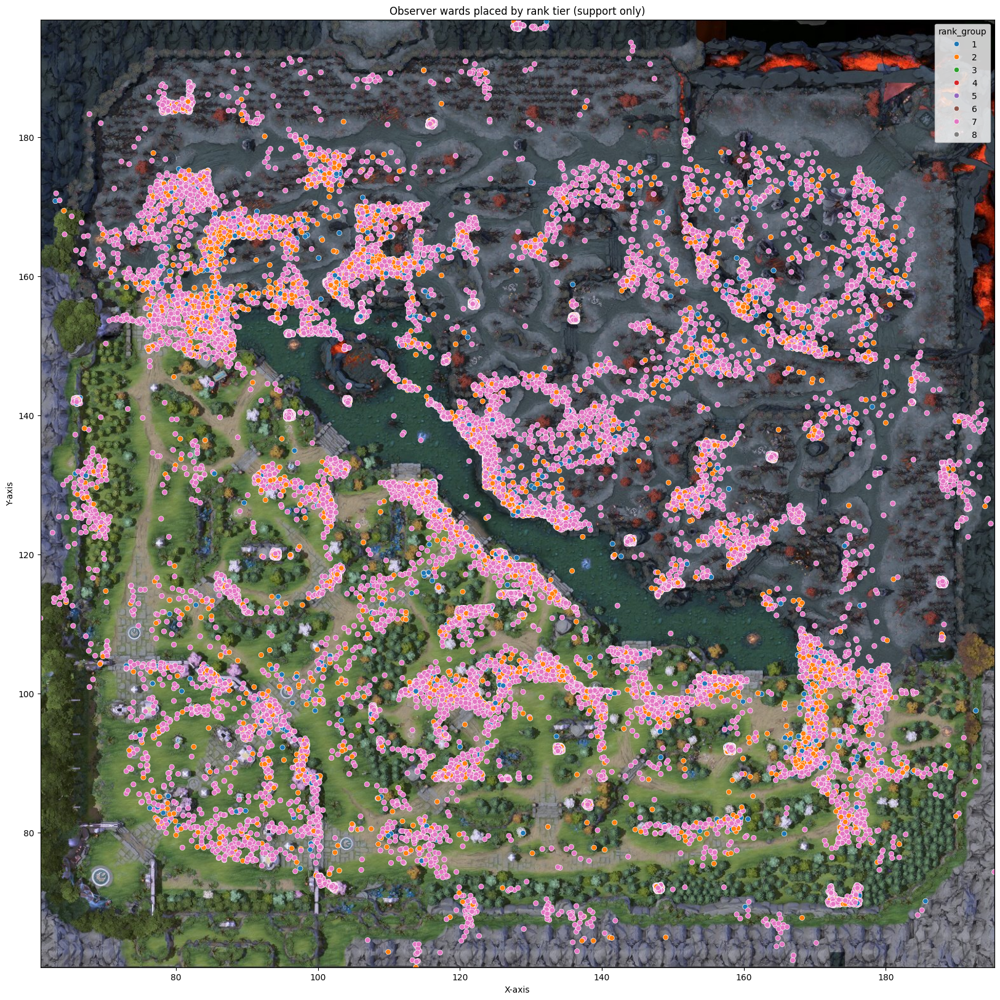

In [ ]:
# create map scatter
dota_map = Image.open(os.path.join("..", "resources", "dota_map.jpg"))

fig, ax = plt.subplots(figsize=(20, 20))

# Image credits: https://washingtondccitymapminecraft.github.io/new-zprcp-the-battleground-of-legends-a-comprehensive-guide-to-the-dota-2-map-rmilp-pics/
ax.imshow(dota_map, extent=[min(coords_obs_support['x']), max(coords_obs_support['x']), min(coords_obs_support['y']), max(coords_obs_support['y'])], aspect='auto')

sns.scatterplot(x='x', y='y', hue='rank_group', data=coords_obs_support, ax=ax)

ax.set_title('Observer wards placed by rank tier (support only)')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

plt.show()

# TODO scatter map is cluttered right now. Find secondary kpis to define wards placed by well-performing suppors?

### Sentry Wards

In [11]:
# filter data
support_hero_ids = get_hero_ids_of_role(Role.SUPPORT)

# only consider higher rank supports
coords_sen_support = coords[(coords["hero_id"].isin(support_hero_ids)) & (coords["rank_group"].isin([1, 2, 7])) & (coords["type"] == "sen_log")]

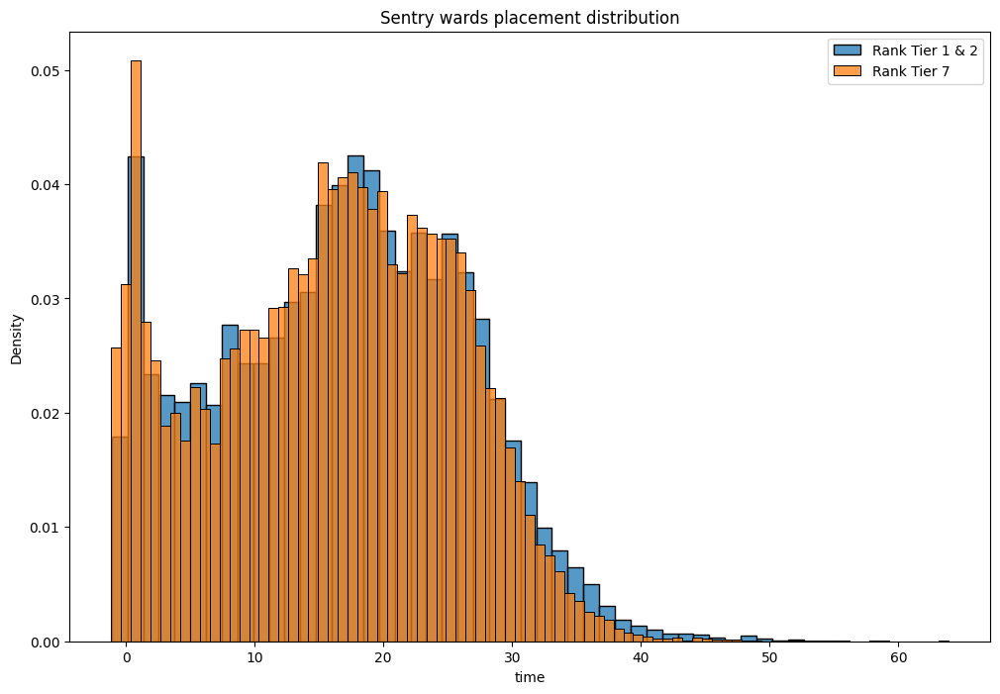

In [12]:
# hist for the ward placement assuming 'time' field equals match duration
fig = plt.figure(figsize=(12, 8))

sns.histplot(coords_sen_support[coords_sen_support["rank_group"].isin([1, 2])], x = "time", stat = "density", label = "Rank Tier 1 & 2")
sns.histplot(coords_sen_support[coords_sen_support["rank_group"].isin([7])], x = "time", stat = "density", label = "Rank Tier 7")
plt.legend(loc = "upper right")
plt.title("Sentry wards placement distribution")
plt.show()

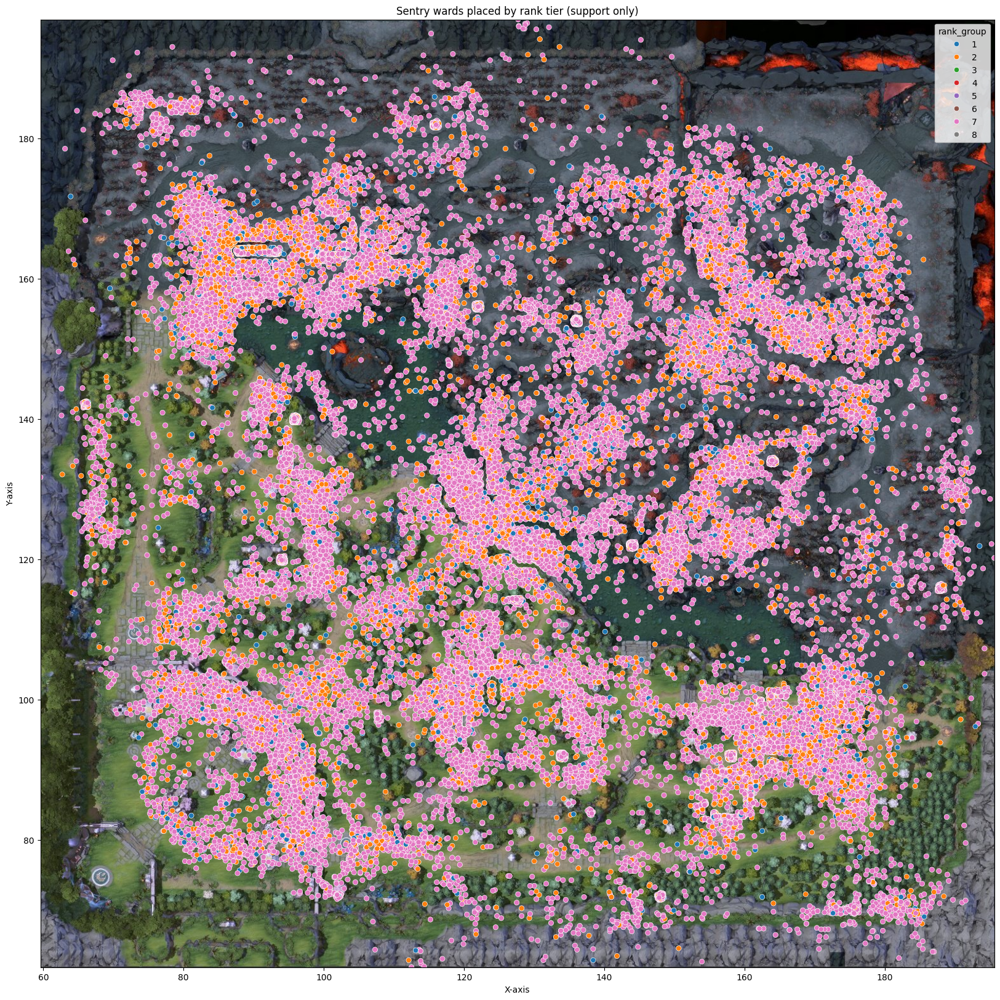

In [13]:
# create map scatter
dota_map = Image.open(os.path.join("..", "resources", "dota_map.jpg"))

fig, ax = plt.subplots(figsize=(20, 20))

# Image credits: https://washingtondccitymapminecraft.github.io/new-zprcp-the-battleground-of-legends-a-comprehensive-guide-to-the-dota-2-map-rmilp-pics/
ax.imshow(dota_map, extent=[min(coords_sen_support['x']), max(coords_sen_support['x']), min(coords_sen_support['y']), max(coords_sen_support['y'])], aspect='auto')

sns.scatterplot(x='x', y='y', hue='rank_group', data=coords_sen_support, ax=ax)

ax.set_title('Sentry wards placed by rank tier (support only)')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

plt.show()